# Spotify Million Playlists

**Author: Allen He**

## Data
The data chosen for this project is the Spotify Million Playlist Dataset. It contains a million json files, each with 1000 playlists stored inside. The format of the data, converted to python, is an outer dictionary containing two keys: one with info of the dataset, and a second with all the playlists as values. The playlists themselves are a dictionary, with the key being a description of the playlist and the values being the tracks in the playlist with unique artist and song identifiers.
[Data Source](https://www.aicrowd.com/challenges/spotify-million-playlist-dataset-challenge)

We begin by importing relevant packages.

In [2]:
import numpy as np
import pandas as pd
import json
import csv
import scipy as sp
import operator
import os
import seaborn as sns
import graspologic
import matplotlib.pyplot as plt
import networkx as nx
import time
from scipy.sparse import csr_matrix
from graspologic.plot import heatmap
from graspologic.plot.plot import networkplot
from graspologic.utils import largest_connected_component
from graspologic.utils import binarize
from graspologic.utils import symmetrize
from graspologic.plot import networkplot
from graspologic.partition import leiden
from graspologic.partition import modularity
from graspologic.layouts.colors import _get_colors
from graspologic.models import DCEREstimator
from graspologic.models import SBMEstimator
from graspologic.models import RDPGEstimator
from graspologic.embed import LaplacianSpectralEmbed
from graspologic import simulations
from graspologic.simulations import sbm
from matplotlib import colors
from sklearn.datasets import make_multilabel_classification
from sklearn.metrics import multilabel_confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn import metrics
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout

In [3]:
with open('spotifydata/data/mpd.slice.1000-1999.json') as json_file:
    data = json.load(json_file)
ndata = data['playlists']

## The Network
We want to eventually be able to predict whether an artist is in a playlist or not. However, we should get a visualization of what we're looking at, so we first create an undirected weighted network where the nodes are playlists, and edges are created between playlists if they share artists. The edge weights are the number of shared artists between the playlists. 
The format for this hashmap will be:

{key: artist, value: {dictionary with key : playlist number, value : # appearances in playlist}} 

In [4]:
trackingDict = {}
#iterate through playlist
for i in range(0, 1000):
    thisPlaylist = ndata[i]
    playlistLength = thisPlaylist['num_tracks']
    
    #iterate through songs
    for j in range(0, playlistLength):
        thisSong = thisPlaylist['tracks'][j]    
        if thisSong['artist_name'] in trackingDict.keys():  
            if i in trackingDict[thisSong['artist_name']].keys():
                trackingDict[thisSong['artist_name']][i] += 1
            else:
                trackingDict[thisSong['artist_name']][i] = 1
        else:
            trackingDict[thisSong['artist_name']] = {i : 1}

In [5]:
print(trackingDict['Tamar Braxton'])
print(len(trackingDict))

{25: 3, 848: 1, 852: 1}
10278


We see here that there are 10278 unique artists in this dataset.

Let's now create the adjacency matrix; to do this, we will need the weight values. First, though, we define a function which will return us all possible permutations of a group of values with a given cardinality. Let us imagine the value of this function. 

Say we have 4 nodes in an undirected, unweighted graph: A, B, C, and D. We are given that A, B, and D are all connected to each other. Then we have the following: 
<img src="permutations.jpg" alt="permutations" height = "350" width="600"/>
This idea will be applied to trackingDict; thus, all we need to do is initialize the adjacency matrix and then fill it in.

In [6]:
def allHyperNodes(toScramble, length, tempArr = []):
    if (len(tempArr) == length):
        return [tempArr]
    ans = []
    for i,j in enumerate(toScramble):
        newTemp = tempArr.copy()
        newTemp.append(j)
        newScramble = toScramble[:i] + toScramble[i+1:] #delete toScramble[:i] for permutation pairs
        ans += allHyperNodes(newScramble, length, newTemp)
    return ans

In [7]:
rows = []
columns = []
weights = []

increment = 0;
for i in trackingDict.keys():
    this = trackingDict[i]
    if len(this) < 2:
        increment += 1
        continue #if its only in one playlist then there are no edges between playlists 
    else:
        combo = allHyperNodes(list(this.keys()), 2)
        for innerList in combo:
            fromNode = innerList[0]
            toNode = innerList[1]
            
            rows.append(fromNode)
            columns.append(toNode)
            
            fromNodeAppearances = this[fromNode]
            toNodeAppearances = this[toNode]
            fromNodePlaylistLength = ndata[fromNode]['num_tracks']
            toNodePlaylistLength = ndata[toNode]['num_tracks']

            fromProp = fromNodeAppearances 
            toProp = toNodeAppearances 
            
            weights.append((min(fromProp, toProp)))
            
    increment += 1

In [8]:
adjacency_matrix = np.zeros((1000, 1000))
for i in range(0, len(rows)):
    adjacency_matrix[rows[i]][columns[i]] = weights[i] 

## Data Visualization
Let's just play around and create a couple graphs depicting information on what playlists contain the most unique artists and which artists are in the most playlists. We start with the former.

We create playlistArtistMap, which is a dictionary which with format {key: playlist name, value: # unique artists}
We then order the dictionary, and plot the result.

In [9]:
playlistArtistMap = {}
for i in range(0, 1000):
    thisPlaylist = ndata[i]
    playlistName = thisPlaylist['name']
    playlistLength = thisPlaylist['num_tracks']
    playlistArtistMap[playlistName] = 0
    artistList = []
    for j in range(0, playlistLength):
        if thisPlaylist['tracks'][j]['artist_name'] in artistList:
            continue
        else:
            playlistArtistMap[playlistName] += 1
            artistList.append(thisPlaylist['tracks'][j]['artist_name'])
sortedPlaylistArtistMap = dict(sorted(playlistArtistMap.items(), key=operator.itemgetter(1),reverse=True))

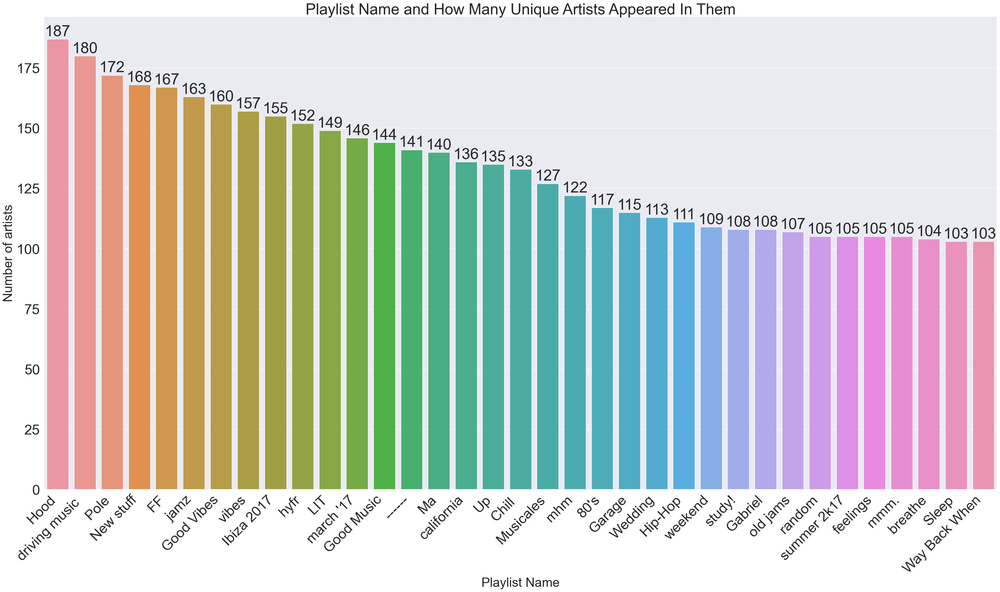

In [10]:
x1 = list(sortedPlaylistArtistMap.keys())[0:35]
y1 = list(sortedPlaylistArtistMap.values())[0:35]

df1 = pd.DataFrame({"Playlist" : x1, "Num Artists" : y1})

sns.set(font_scale = 3)
plt.figure(figsize=(40,20))
ax = sns.barplot(x = x1, y = y1, data = df1, order = df1.sort_values('Num Artists', ascending = False).Playlist)

plt.title("Playlist Name and How Many Unique Artists Appeared In Them")
plt.ylabel('Number of artists', fontsize=30)
plt.xlabel('Playlist Name', fontsize=30)
plt.xticks(rotation=45, ha='right')

rects = ax.patches
labels = y1
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom')

Now for the inverse (artist x how many playlists they appeared in):

In [11]:
artistAppearances = {}
for key, value in trackingDict.items():
    numLen = len(trackingDict[key])
    artistAppearances[key] = numLen

artistAppearances = dict(sorted(artistAppearances.items(), key=operator.itemgetter(1),reverse=True))

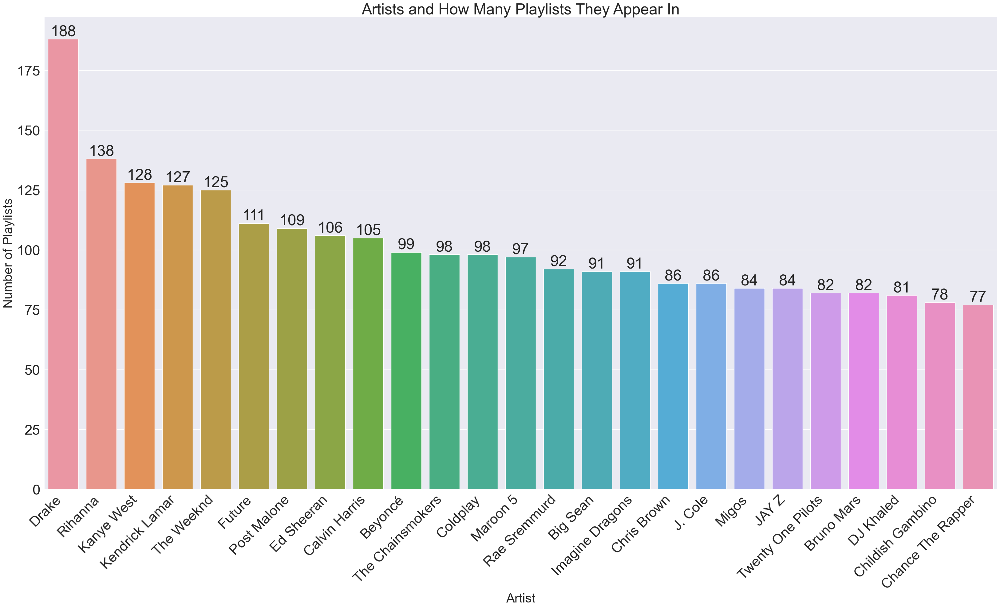

In [12]:
x2 = list(artistAppearances.keys())[0:25]
y2 = list(artistAppearances.values())[0:25]

df2 = pd.DataFrame({"Artist" : x2, "Num Appearances" : y2})

sns.set(font_scale = 3)
plt.figure(figsize=(40,20))
ax = sns.barplot(x = x2, y = y2, data = df2, order = df2.sort_values('Num Appearances', ascending = False).Artist)

plt.title("Artists and How Many Playlists They Appear In")
plt.ylabel('Number of Playlists', fontsize=30)
plt.xlabel('Artist', fontsize=30)
plt.xticks(rotation=45, ha='right')

rects = ax.patches
labels = y2
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom')

We can tell from these graphs that there will be a lot of edges; Drake himself will be responsible for (188 * 187 = 35156) edges.

## Network Visualization
We first check out what our heatmap looks like - this will be great for informing us about the density of our network.

Text(0.5, 1.0, 'Heatmap of Edges for Adjacency Matrix')

<Figure size 1500x1500 with 0 Axes>

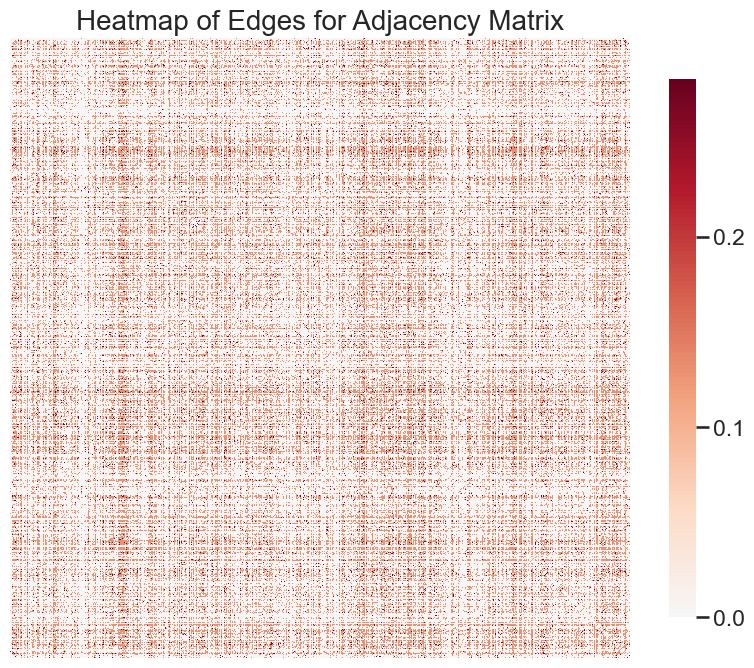

In [13]:
plt.figure(figsize=(15,15))
ax = heatmap(adjacency_matrix, transform = "simple-all")
plt.title("Heatmap of Edges for Adjacency Matrix", fontsize = 20)

It appears as if this network is extremely dense; in fact, it looks fully connected. Let's check.

In [14]:
adj_matrix_lcc = largest_connected_component(adjacency_matrix)
adj_matrix_lcc.shape

(992, 992)

Indeed, out of the 1000 nodes, 992 of them make up the largest connected component. We can, incidentally, create a networkX graph from this largest connected component, and then trim out the isolated nodes. While we're at it, we'll also remove nodes with only 1 edge since they will mess up the scaling of the visualization. 

In [15]:
graph = nx.from_numpy_array(adj_matrix_lcc, create_using=nx.Graph)
# nodelist = list(graph.nodes)
# adjacency_matrix = nx.to_numpy_array(graph, nodelist=nodelist)
node_data = pd.DataFrame(index=graph.nodes())
pos = nx.kamada_kawai_layout(graph)
node_data["x"] = [pos[node][0] for node in node_data.index]
node_data["y"] = [pos[node][1] for node in node_data.index]
node_data["degree"] = node_data.index.map(dict(nx.degree(graph)))

In [16]:
print(node_data.loc[node_data['degree'] == 0])
print(node_data.loc[node_data['degree'] == 1])

Empty DataFrame
Columns: [x, y, degree]
Index: []
            x         y  degree
519  0.589877 -0.379101       1
589 -0.395395  0.498593       1
977  1.000000  0.128984       1


In [17]:
#Delete these nodes from adjacency matrix AND dataframe
node_data = node_data.drop([519, 589, 977])
adj_matrix_lcc = np.delete(adj_matrix_lcc, 519, 1)
adj_matrix_lcc = np.delete(adj_matrix_lcc, 519, 0)
adj_matrix_lcc = np.delete(adj_matrix_lcc, 588, 1)
adj_matrix_lcc = np.delete(adj_matrix_lcc, 588, 0)
adj_matrix_lcc = np.delete(adj_matrix_lcc, 975, 1)
adj_matrix_lcc = np.delete(adj_matrix_lcc, 975, 0)

In [18]:
#update graph
graph = nx.from_numpy_array(adj_matrix_lcc, create_using=nx.Graph)
node_data = pd.DataFrame(index=graph.nodes())
pos = nx.kamada_kawai_layout(graph)
node_data["x"] = [pos[node][0] for node in node_data.index]
node_data["y"] = [pos[node][1] for node in node_data.index]
node_data["degree"] = node_data.index.map(dict(nx.degree(graph)))

Now we attempt to find communities in the network through leiden partitioning, and then update the dataframe with said partitions as well as a color to associate with each partition.

In [19]:
main_random_state = np.random.default_rng(8888)
colors2 = _get_colors(True, None)["nominal"]

partition_map = leiden(
    graph,
    resolution=2,
    random_seed=int(main_random_state.integers(np.iinfo(np.int32).max)),
    trials = 5
)
print(f"Number of unique partitions: {len(np.unique(list(partition_map.values())))}")

# Define the color map
nx.set_node_attributes(graph, partition_map, name="partition")
palette = dict(zip(np.unique(list(partition_map.values())), colors2))

node_data['leiden_partition'] = node_data.index.map(partition_map)

associated_colors = []
for i in list(node_data['leiden_partition']):
    associated_colors.append(palette[i])
    
node_data['color'] = associated_colors

Number of unique partitions: 97


In [20]:
modularity(graph, partition_map)

0.09032807916554014

The modularity of the graph checks out with the information we've discovered so far. A modularity this low suggests that there are more edges from nodes in different communities than edges isolated into the same community. Given the highly connected nature of this graph, that makes sense.

We also want to plot our nodes in a way s.t. nodes with more degrees are more visible. We plot the degree distribution to help with this.

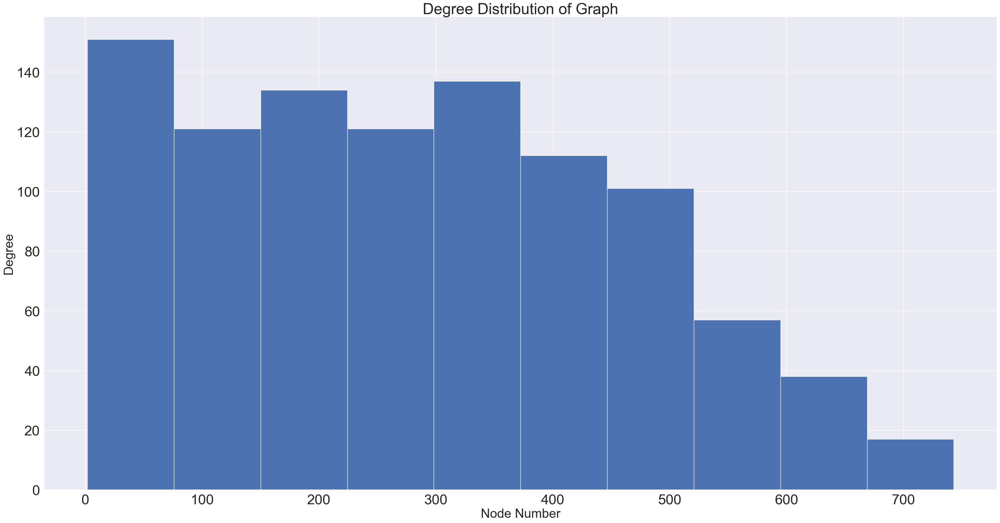

In [21]:
def plot_degree_dist(G):
    degrees = [G.degree(n) for n in G.nodes()]
    plt.figure(figsize=(40,20))
    plt.hist(degrees)
    plt.title("Degree Distribution of Graph")
    plt.ylabel('Degree', fontsize=30)
    plt.xlabel('Node Number', fontsize=30)

plot_degree_dist(graph)

In [22]:
node_data['sizes'] = node_data.apply(lambda r: .90*r.degree, axis = 1)
sizing_chart = dict(zip(node_data.degree, node_data.sizes))
deg = np.array(list(node_data.degree))
degLIST = list(node_data.degree)

Text(0.5, 1.0, 'Leiden Graph')

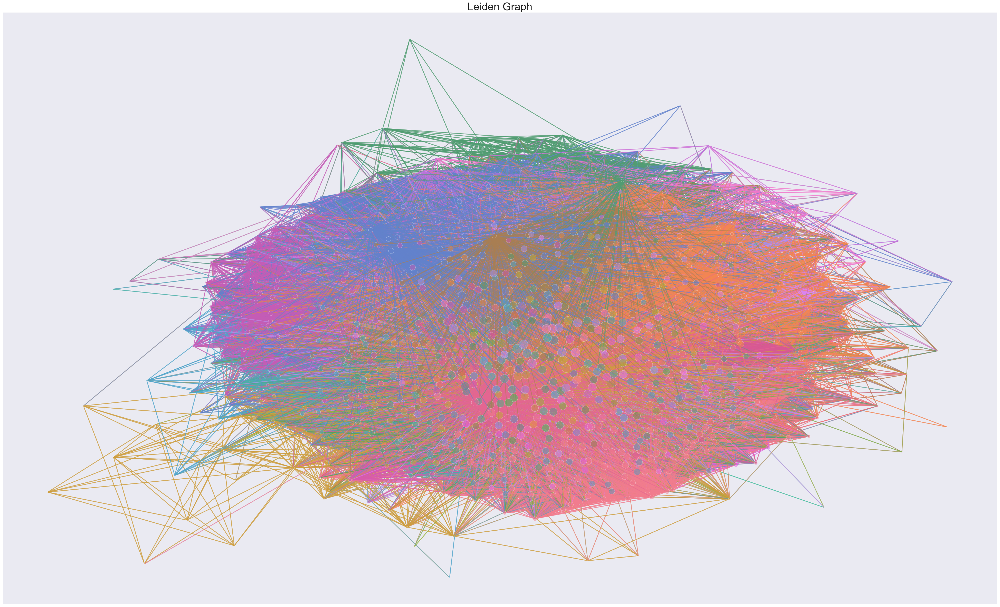

In [23]:
# embed_params = dict(n_components=64, n_neighbors=64, embedding_algorithm="lse")
fig, ax = plt.subplots(1, 1, figsize = (50, 30))

random_seed = main_random_state.integers(np.iinfo(np.int32).max)
random_state = np.random.default_rng(random_seed)
networkplot(
    adjacency = adj_matrix_lcc,
    node_data = node_data,
    x = 'x',
    y = 'y',
    ax = ax,
    node_hue = 'leiden_partition',
    palette = palette,
    node_size = deg,
    node_sizes = sizing_chart,
    edge_linewidth = 2.0,
    figsize = (50, 50),
    edge_alpha=0.6,
    node_alpha = 0.5
)

plt.title("Leiden Graph", fontsize = 30)

## Machine Learning
Our plan is to figure out whether an artist belongs in a playlist or not through multi-label binary classification. To build inputs, we use the Laplacian Spectral Embedding to turn our nodes into n-dimensional vectors. We also want to see the effect that centrality measures have on the models, so we create embeddings with betweenness and eigenvector centrality measures as well.

In [24]:
lse = LaplacianSpectralEmbed(n_components = 97) #number of communities 
embedding = lse.fit_transform(adj_matrix_lcc)

nodelist = list(graph.nodes)

def map_to_nodes(node_map):
    node_map.setdefault(0)
    # utility function to make it easy to compare dicts to array outputs
    return np.array(np.vectorize(lambda x: node_map.setdefault(x, 0))(nodelist))

between = map_to_nodes(nx.betweenness_centrality(graph))
between = between[np.newaxis]
between = between.T

eigenv = map_to_nodes(nx.eigenvector_centrality(graph))
eigenv = eigenv[np.newaxis]
eigenv = eigenv.T

In [25]:
embedding2 = np.append(embedding, between, 1)
embedding3 = np.append(embedding, eigenv, 1)
embedding4 = np.append(embedding2, eigenv, 1)

To actually create the labels, we use Sci-Kit's MultiLabelBinarizer. To initialize this, we feed it in an ordering for the labels. Since our trackingDict is from artist : playlist, we will need to transpose the results to match it with our embeddings shape. We also need to remove the nodes that were previously deleted out of our graph. We can manually do this, as we kept track of those nodes earlier. 

In [26]:
# multilabel classification labels
unprocessed_labels = []
for key, value in trackingDict.items():
    unprocessed_labels.append(list(value.keys()))
    
class_list = [i for i in range(0, 1000)]

multilabel_binarizer = MultiLabelBinarizer(classes = class_list)
multilabel_binarizer.fit(class_list)
processed_labels = multilabel_binarizer.transform(unprocessed_labels)
processed_labels = np.transpose(processed_labels)
processed_labels.shape

(1000, 10278)

In [27]:
node_to_delete = [20, 118, 147, 398, 518, 524, 594, 606, 721, 911, 985] #these are the nodes we dropped earlier
node_to_delete = node_to_delete[::-1]

for i in node_to_delete:
    processed_labels = np.delete(processed_labels, i, 0)

To help figure out model proficiency, we write a function which takes in two 2D arrays and returns metrics which can compute accuracy, recall, and precision: true positive, false positive, false negative. 

In [28]:
def compute_acc(a, b): #each are 2D lists with same length, a is actual b is predicted
    ARTIST_NOT_IN_AND_TRUE = 0 #artist is not in actual playlist and b corroborates (TRUE NEGATIVE)
    ARTIST_NOT_IN_AND_FALSE = 0 #artist is not in actual playlist but b contains artist (FALSE POSITIVE)
    ARTIST_IN_AND_TRUE = 0 #artist is in actual playlist and b corroborates (TRUE POSITIVE)
    ARTIST_IN_AND_FALSE = 0 #artist is in actual playlist but b does not contain (FALSE NEGATIVE)
    for i in range(0, len(a)):
        for j in range(0, len(a[i])):
            this = a[i][j]
            other = b[i][j]
            if (this == other == 0):
                ARTIST_NOT_IN_AND_TRUE += 1
            elif (this == 0 and other == 1):
                ARTIST_NOT_IN_AND_FALSE += 1
            elif (this == other == 1):
                ARTIST_IN_AND_TRUE += 1
            elif (this == 1 and other == 0):
                ARTIST_IN_AND_FALSE += 1
    return [ARTIST_NOT_IN_AND_TRUE, ARTIST_NOT_IN_AND_FALSE, ARTIST_IN_AND_TRUE, ARTIST_IN_AND_FALSE]

Now that we have embeddings and labels, we can make train-test splits and models, one for each of our embeddings. Although first, we should also
see how well classification goes with completely random labeling.

In [29]:
X_train, X_test, y_train, y_test = train_test_split(embedding, processed_labels, test_size=0.30)
X_train2, X_test2, y_train2, y_test2 = train_test_split(embedding2, processed_labels, test_size=0.30)
X_train3, X_test3, y_train3, y_test3 = train_test_split(embedding3, processed_labels, test_size=0.30)
X_train4, X_test4, y_train4, y_test4 = train_test_split(embedding4, processed_labels, test_size=0.30)

In [182]:
rng = np.random.default_rng()
random_result = rng.integers(2, size=(297, 10278))

random_acc = compute_acc(y_test, random_result)
print(random_acc)
acc1 = (random_acc[0] + random_acc[2]) / (random_acc[0] + random_acc[2] + random_acc[1] + random_acc[3])
recall1 = ((random_acc[2]) / (random_acc[2] + random_acc[3])) #recall
precision1 = ((random_acc[2]) / (random_acc[2] + random_acc[1])) #precision
print(acc1, recall1, precision1)

[1521115, 1519912, 5789, 5750]
0.5002034354048365 0.5016899211370136 0.003794321429952527


Expectedly, we get an accuracy of ~50%, as well as a recall of ~50%. This means that we are predicting an almost equal amount of true positives and false negatives - this checks out, because if an artist is actually in a playlist, then in the random model, there's a 50/50 chance that artist appears. The sub-1% precision means there are WAY too many false positives, which makes sense in context because most of the playlists should have predominantly 0 labels, and these 0 labels are a 50/50 to be a 1 in the random model. 

### NN Model
We build some simple neural networks in Keras, without worrying about hidden layers. We take n input dimensions and the input layer has n + 1 neurons in each case, while the output layer is the same size as the number of labels to predict. 

Each neuron in the first layer is connected to every neuron in the next layer. A weight determines the strength of the connection between two neurons. An activation function basically determines which neurons in the layer are relevant by examining the sum of the weighted inputs. In forward propagation, these are the parameters which a model makes prediction through. The learning comes in back propogation, when the model goes backwards from the predicted output; it is here that weights and biases are adjusted to minimize the loss function.

According to Sci-Kit, the loss function for multi-label classification models should be a binary-crossentropy loss function. Binary cross-entropy will calculate a score based on the distance of a label from its expected value. The activation function is sigmoid, which will compute probabilities in a continuous range between 0 and 1. Hence, we create an alpha-value to optimize that will determine the threshold for whether a label should be a concrete 0 or 1. 

In [60]:
#NN Model W/ First Embedding
model = Sequential()
model.add(Dense(98, input_dim=97, activation='relu'))
model.add(Dense(10278, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam')

In [200]:
model.fit(X_train, y_train, verbose=0, epochs=100)
s1_alpha = 0.15
s1_accs = [0]
s1_recalls = [0]
s1_precisions = [0]
stop = False
RUN = 1
while stop == False:
    y_pred = model.predict(X_test)
    for i in range(0, len(y_pred)):
        for j in range(0, len(y_pred[i])):
            if y_pred[i][j] < s1_alpha:
                y_pred[i][j] = 0
            else:
                y_pred[i][j] = 1
    try:
        split1_acc = compute_acc(y_test, y_pred)
        true_acc = (split1_acc[0] + split1_acc[2]) / (split1_acc[0] + split1_acc[2] + split1_acc[1] + split1_acc[3])
        recall = ((split1_acc[2]) / (split1_acc[2] + split1_acc[3])) #recall
        precision = ((split1_acc[2]) / (split1_acc[2] + split1_acc[1])) #precision
    except:
        print("End of Model")
        break
    print("Run Number {} => with alpha: {} | acc: {} | recall: {} | precision: {} ".format(RUN, s1_alpha, true_acc, recall, precision))
    RUN += 1
    if RUN > 2 and (true_acc < s1_accs[-1] and true_acc < s1_accs[-2]):
        stop = True
    s1_accs.append(true_acc)
    s1_recalls.append(recall)
    s1_precisions.append(precision)
    s1_alpha += .01

10/10 [==============================] - 0s 5ms/step
Run Number 1 => with alpha: 0.15 | acc: 0.9961625727338901 | recall: 0.005979720946355837 | precision: 0.22044728434504793 
10/10 [==============================] - 0s 5ms/step
Run Number 2 => with alpha: 0.16 | acc: 0.9961687970055356 | recall: 0.005373082589479158 | precision: 0.22142857142857142 
10/10 [==============================] - 0s 5ms/step
Run Number 3 => with alpha: 0.17 | acc: 0.9961894353799393 | recall: 0.005199757344657249 | precision: 0.28169014084507044 
10/10 [==============================] - 0s 4ms/step
Run Number 4 => with alpha: 0.18000000000000002 | acc: 0.9962130220935436 | recall: 0.0036398301412600745 | precision: 0.4 
10/10 [==============================] - 0s 4ms/step
Run Number 5 => with alpha: 0.19000000000000003 | acc: 0.9962192463651891 | recall: 0.0012132767137533582 | precision: 0.4666666666666667 
10/10 [==============================] - 0s 4ms/step
Run Number 6 => with alpha: 0.20000000000000004

In [203]:
#NN Model W/ Second Embedding (betweeness centrality)
model2 = Sequential()
model2.add(Dense(99, input_dim=98, activation='relu'))
model2.add(Dense(10278, activation='sigmoid'))
model2.compile(loss='binary_crossentropy', optimizer='adam')

In [205]:
model2.fit(X_train2, y_train2, verbose=0, epochs=100)
s2_alpha = 0.15
s2_accs = [0]
s2_recalls = [0]
s2_precisions = [0]
stop = False
RUN = 1
while stop == False:
    y_pred2 = model2.predict(X_test2)
    for i in range(0, len(y_pred2)):
        for j in range(0, len(y_pred2[i])):
            if y_pred2[i][j] < s2_alpha:
                y_pred2[i][j] = 0
            else:
                y_pred2[i][j] = 1
    try:
        ssss = compute_acc(y_test2, y_pred2)
        true_acc = (ssss[0] + ssss[2]) / (ssss[0] + ssss[2] + ssss[1] + ssss[3])
        recall = ((ssss[2]) / (ssss[2] + ssss[3])) #recall
        precision = ((ssss[2]) / (ssss[2] + ssss[1])) #precision
    except:
        print("End of Model")
        break
    print("Run Number {} => with alpha: {} | acc: {} | recall: {} | precision: {} ".format(RUN, s2_alpha, true_acc, recall, precision))
    RUN += 1
    if RUN > 2 and (true_acc < s2_accs[-1] and true_acc < s2_accs[-2]):
        stop = True
    s2_accs.append(true_acc)
    s2_recalls.append(recall)
    s2_precisions.append(precision)
    s_2alpha += .01

10/10 [==============================] - 0s 5ms/step
Run Number 1 => with alpha: 0.15 | acc: 0.9963509388494795 | recall: 0.04135442686650014 | precision: 0.36519607843137253 
10/10 [==============================] - 0s 4ms/step
Run Number 2 => with alpha: 0.16 | acc: 0.9963925431915314 | recall: 0.03654362105652697 | precision: 0.39778449144008055 
10/10 [==============================] - 0s 4ms/step
Run Number 3 => with alpha: 0.17 | acc: 0.9964121987862015 | recall: 0.03210287723193635 | precision: 0.4145758661887694 
10/10 [==============================] - 0s 4ms/step
Run Number 4 => with alpha: 0.18000000000000002 | acc: 0.9964289060416712 | recall: 0.0271070404292719 | precision: 0.43215339233038347 
10/10 [==============================] - 0s 4ms/step
Run Number 5 => with alpha: 0.19000000000000003 | acc: 0.9964456132971409 | recall: 0.024424091035248403 | precision: 0.46397188049209137 
10/10 [==============================] - 0s 3ms/step
Run Number 6 => with alpha: 0.20000000

In [221]:
#NN Model with Third Embedding (eigenvector centrality)
model3 = Sequential()
model3.add(Dense(99, input_dim=98, activation='relu'))
model3.add(Dense(10278, activation='sigmoid'))
model3.compile(loss='binary_crossentropy', optimizer='adam')

In [227]:
model3.fit(X_train3, y_train3, verbose=0, epochs=100)
s3_alpha = 0.15
s3_accs = [0]
s3_recalls = [0]
s3_precisions = [0]
stop = False
RUN = 1
while stop == False:
    y_pred3 = model3.predict(X_test3)
    for i in range(0, len(y_pred3)):
        for j in range(0, len(y_pred3[i])):
            if y_pred3[i][j] < s3_alpha:
                y_pred3[i][j] = 0
            else:
                y_pred3[i][j] = 1
    try:
        ssss = compute_acc(y_test3, y_pred3)
        true_acc = (ssss[0] + ssss[2]) / (ssss[0] + ssss[2] + ssss[1] + ssss[3])
        recall = ((ssss[2]) / (ssss[2] + ssss[3])) #recall
        precision = ((ssss[2]) / (ssss[2] + ssss[1])) #precision
    except:
        print("End of Model")
        break
    print("Run Number {} => with alpha: {} | acc: {} | recall: {} | precision: {} ".format(RUN, s3_alpha, true_acc, recall, precision))
    RUN += 1
    if RUN > 2 and (true_acc < s3_accs[-1] and true_acc < s3_accs[-2]):
        stop = True
    s3_accs.append(true_acc)
    s3_recalls.append(recall)
    s3_precisions.append(precision)
    s3_alpha += .01

10/10 [==============================] - 0s 5ms/step
Run Number 1 => with alpha: 0.15 | acc: 0.9962860753870678 | recall: 0.08537483882851354 | precision: 0.39734247749678525 
10/10 [==============================] - 0s 4ms/step
Run Number 2 => with alpha: 0.16 | acc: 0.9963404558656553 | recall: 0.07690182354024683 | precision: 0.4210791729702471 
10/10 [==============================] - 0s 3ms/step
Run Number 3 => with alpha: 0.17 | acc: 0.9963856637333968 | recall: 0.06806041628292503 | precision: 0.4470659407138536 
10/10 [==============================] - 0s 4ms/step
Run Number 4 => with alpha: 0.18000000000000002 | acc: 0.9964072848875339 | recall: 0.06124516485540615 | precision: 0.4621264767199444 
10/10 [==============================] - 0s 5ms/step
Run Number 5 => with alpha: 0.19000000000000003 | acc: 0.9964289060416712 | recall: 0.05599557929637134 | precision: 0.482922954725973 
10/10 [==============================] - 0s 3ms/step
Run Number 6 => with alpha: 0.200000000000

In [228]:
#NN Model with Fourth Embedding (betweeness and eigenvector centrality)
model4 = Sequential()
model4.add(Dense(100, input_dim=99, activation='relu'))
model4.add(Dense(10278, activation='sigmoid'))
model4.compile(loss='binary_crossentropy', optimizer='adam')

In [229]:
model4.fit(X_train4, y_train4, verbose=0, epochs=100)
s4_alpha = 0.15
s4_accs = [0]
s4_recalls = [0]
s4_precisions = [0]
stop = False
RUN = 1
while stop == False:
    y_pred4 = model4.predict(X_test4)
    for i in range(0, len(y_pred4)):
        for j in range(0, len(y_pred4[i])):
            if y_pred4[i][j] < s4_alpha:
                y_pred4[i][j] = 0
            else:
                y_pred4[i][j] = 1
    try:
        ssss = compute_acc(y_test4, y_pred4)
        true_acc = (ssss[0] + ssss[2]) / (ssss[0] + ssss[2] + ssss[1] + ssss[3])
        recall = ((ssss[2]) / (ssss[2] + ssss[3])) #recall
        precision = ((ssss[2]) / (ssss[2] + ssss[1])) #precision
    except:
        print("End of Model")
        break
    print("Run Number {} => with alpha: {} | acc: {} | recall: {} | precision: {} ".format(RUN, s4_alpha, true_acc, recall, precision))
    RUN += 1
    if RUN > 2 and (true_acc < s4_accs[-1] and true_acc < s4_accs[-2]):
        stop = True
    s4_accs.append(true_acc)
    s4_recalls.append(recall)
    s4_precisions.append(precision)
    s4_alpha += .01

10/10 [==============================] - 0s 4ms/step
Run Number 1 => with alpha: 0.15 | acc: 0.9964531479417644 | recall: 0.006989044200982244 | precision: 0.19121447028423771 
10/10 [==============================] - 0s 3ms/step
Run Number 2 => with alpha: 0.16 | acc: 0.9964649412985666 | recall: 0.005572346052134492 | precision: 0.1838006230529595 
10/10 [==============================] - 0s 3ms/step
Run Number 3 => with alpha: 0.17 | acc: 0.9964675620445226 | recall: 0.005005666792595391 | precision: 0.1760797342192691 
10/10 [==============================] - 0s 3ms/step
Run Number 4 => with alpha: 0.18000000000000002 | acc: 0.9964711655702121 | recall: 0.005005666792595391 | precision: 0.18275862068965518 
10/10 [==============================] - 0s 3ms/step
Run Number 5 => with alpha: 0.19000000000000003 | acc: 0.9964934419108383 | recall: 0.004911220249338874 | precision: 0.23636363636363636 
10/10 [==============================] - 0s 3ms/step
Run Number 6 => with alpha: 0.2000

### Random Forest Classifier
The random forest classifier learns through decision trees; it basically looks at a feature, and splits the data based on that feature, and then continuously makes splits. How do we determine the quality of these splits? We use something called the _gini impurity_ value; this essentially measures the diversity of data in a given tree. The lower the impurity, the lower the chance of misclassification. 

In [30]:
RFCL = RandomForestClassifier(n_estimators = 150, random_state=0)
RFCL_fit = RFCL.fit(X_train, y_train)
y_RFCLpred = RFCL_fit.predict(X_test)
ssss = compute_acc(y_test, y_RFCLpred)
true_acc = (ssss[0] + ssss[2]) / (ssss[0] + ssss[2] + ssss[1] + ssss[3])
recall = ((ssss[2]) / (ssss[2] + ssss[3])) #recall
precision = ((ssss[2]) / (ssss[2] + ssss[1])) #precision
print(ssss)
print(true_acc, recall, precision)

[3041629, 64, 282, 10591]
0.9965094939798189 0.025935804285845673 0.815028901734104


### KNN Classifier
KNN in theory should work great with embeddings based off communities; this is because the KNN model associates datapoints which are closely related/close together to be clusters. Hence, it will end up classifying our test data by seeing which cluster it falls closer to. 

In [31]:
KNN = KNeighborsClassifier(n_neighbors=97)
KNN_fit = KNN.fit(X_train, y_train)
y_KNNpred = KNN_fit.predict(X_test)
ssss = compute_acc(y_test, y_KNNpred)
true_acc = (ssss[0] + ssss[2]) / (ssss[0] + ssss[2] + ssss[1] + ssss[3])
recall = ((ssss[2]) / (ssss[2] + ssss[3])) #recall
precision = ((ssss[2]) / (ssss[2] + ssss[1])) #precision
print(ssss)
print(true_acc, recall, precision)

C:\Users\allen\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


[3041665, 28, 92, 10781]
0.9964590446201654 0.008461326220914191 0.7666666666666667


## Results 
We want to visualize our results so they are easier to interpret. To do that, we create 4 dictionaries, each one measuring a different metric. From there, we can just plot.

In [63]:
NN_optimal_alphas = {'NN LSE Embeddings' : 0.19,
                 'NN LSE w/ Betweenness' : .28,
                 'NN LSE w/ Eigenvector' : .27,
                 'NN LSE w/ Both' : .22}

optimal_accuracies = {'NN LSE Embeddings' : 0.9962192463651891,
                 'NN LSE w/ Betweenness' : 0.996471820756701,
                 'NN LSE w/ Eigenvector' : 0.9964855796729702,
                 'NN LSE w/ Both' : 0.9965320979136897,
                 'Random Forest' : 0.9965094939798189,
                 'K-Nearest Neighbor' : 0.9964590446201654}

optimal_recall = {'NN LSE Embeddings' : 0.0012132767137533,
                 'NN w/ Betweenness' : 0.008141363678416,
                 'NN w/ Eigenvector' : 0.02587953582612,
                 'NN w/ Both' : 0.00037778617302607,
                 'Random Forest' : 0.025935804285846,
                 'K-Nearest Neighbor' : 0.008461326220914}

optimal_precisions = {'NN LSE Embeddings' : 0.4666666666666667,
                 'NN LSE w/ Betweenness' : 0.6423357664233577,
                 'NN LSE w/ Eigenvector' : 0.6504629629629629,
                 'NN LSE w/ Both' : 0.6666666666666666,
                 'Random Forest' : 0.815028901734104,
                 'K-Nearest Neighbor' : 0.7666666666666667}

In [64]:
sortedAlphas = dict(sorted(NN_optimal_alphas.items(), key=operator.itemgetter(1),reverse=True))
sortedAccs = dict(sorted(optimal_accuracies.items(), key=operator.itemgetter(1),reverse=True))
sortedRecalls = dict(sorted(optimal_recall.items(), key=operator.itemgetter(1),reverse=True))
sortedPrecisions = dict(sorted(optimal_precisions.items(), key=operator.itemgetter(1),reverse=True))

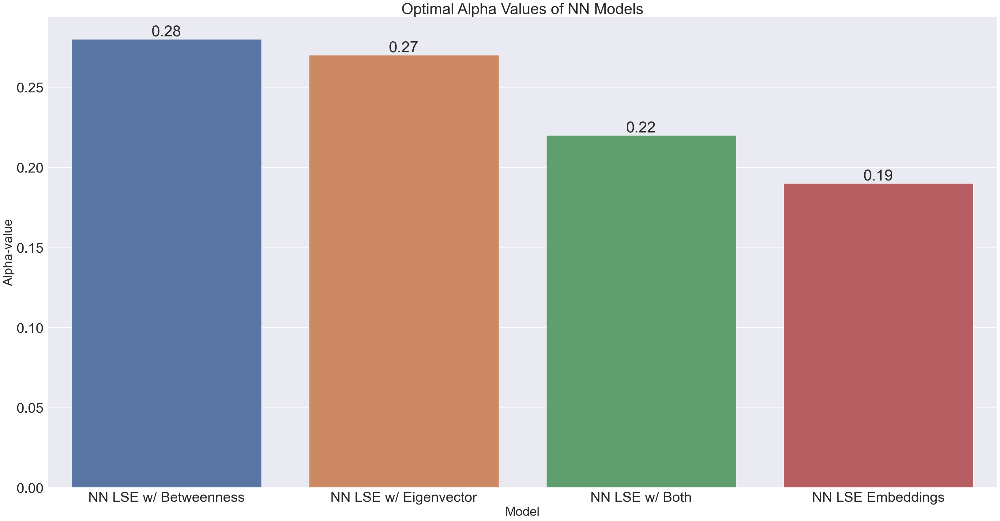

In [65]:
x3 = list(sortedAlphas.keys())[0:35]
y3 = list(sortedAlphas.values())[0:35]

df3 = pd.DataFrame({"Model" : x3, "Optimal Alpha" : y3})

sns.set(font_scale = 3)
plt.figure(figsize=(40,20))
ax = sns.barplot(x = x3, y = y3, data = df3, order = df3.sort_values('Optimal Alpha', ascending = False).Model)

plt.title("Optimal Alpha Values of NN Models")
plt.ylabel('Alpha-value', fontsize=30)
plt.xlabel('Model', fontsize=30)

rects = ax.patches
labels = y3
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom')

(0.996, 0.9966)

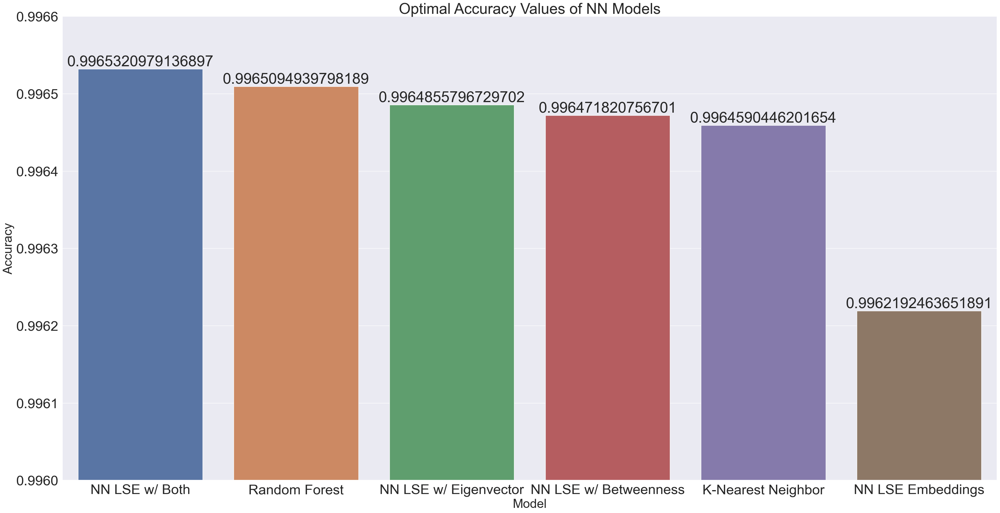

In [66]:
x4 = list(sortedAccs.keys())[0:35]
y4 = list(sortedAccs.values())[0:35]

df4 = pd.DataFrame({"Model" : x4, "Accuracy" : y4})

sns.set(font_scale = 3)
plt.figure(figsize=(40,20))
ax = sns.barplot(x = x4, y = y4, data = df4, order = df4.sort_values('Accuracy', ascending = False).Model)

plt.title("Optimal Accuracy Values of NN Models")
plt.ylabel('Accuracy', fontsize=30)
plt.xlabel('Model', fontsize=30)

rects = ax.patches
labels = y4
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom')
    
ax.set_ylim(0.996,0.9966)

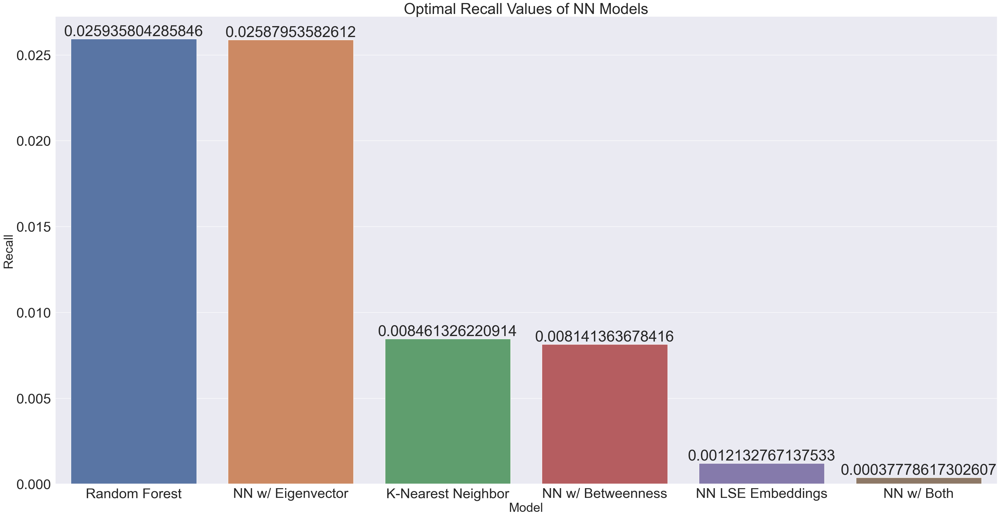

In [67]:
x5 = list(sortedRecalls.keys())[0:35]
y5 = list(sortedRecalls.values())[0:35]

df5 = pd.DataFrame({"Model" : x5, "Recall" : y5})

sns.set(font_scale = 3)
plt.figure(figsize=(40,20))
ax = sns.barplot(x = x5, y = y5, data = df5, order = df5.sort_values('Recall', ascending = False).Model)

plt.title("Optimal Recall Values of NN Models")
plt.ylabel('Recall', fontsize=30)
plt.xlabel('Model', fontsize=30)

rects = ax.patches
labels = y5
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom')

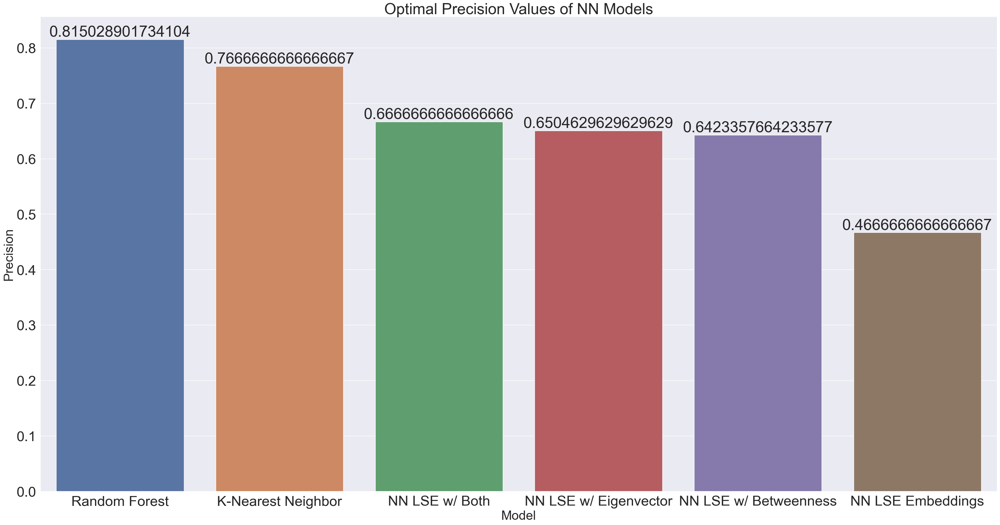

In [68]:
x6 = list(sortedPrecisions.keys())[0:35]
y6 = list(sortedPrecisions.values())[0:35]

df6 = pd.DataFrame({"Model" : x6, "Precision" : y6})

sns.set(font_scale = 3)
plt.figure(figsize=(40,20))
ax = sns.barplot(x = x6, y = y6, data = df6, order = df6.sort_values('Precision', ascending = False).Model)

plt.title("Optimal Precision Values of NN Models")
plt.ylabel('Precision', fontsize=30)
plt.xlabel('Model', fontsize=30)

rects = ax.patches
labels = y6
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom')

We observe that in the neural networks, the alpha-value which produces the best results ranges the gamut from 0.19-0.28, although the alphas for embeddings including either betweenness or eigenvector centrality could be considered significantly different from the other alphas. This tells us that including a single centrality measure as an input feature (even though it's just 1 feature out of 98) has a large impact on the neural network's learning. 

In terms of accuracy, every model tested had significantly high accuracy. We can explain this quite easily; if we look back to our graph of playlists with the most unique artists, no playlist had more than 188 unique artists. This means that there are always at least 10,090 spots in the label matrix _in each row_ which are 0s. With such an overwhelming majority, any model would be more inclined to predict a 0 in any given spot. 

The recall values for all the models are noticeably horrible. We note that recall is measured by {(true positive) / (true positive + false negative)}. Given what we concluded about the accuracy, it makes a lot of sense that the model is overpredicting artists to not be in a playlist. 

Precision performed overwhelmingly better than recall. Precision is measured by {(true positive) / (true positive + false positive)}. Given the decent precision of models such as the Random Forest and KNN, we can say that those models typically do not misclassify an artist as being in a playlist when they actually aren't. We note the particular outlier of the NN which was only run with LSE embeddings, which did way worse than the RF and KNN models run on the same embedding, as well as performing worse than the embeddings with centrality measures. Hence, we cannot just conclude that the NN just did not have enough data. Certainly, more parameter tuning is necessary, but there may be something about the embeddings themselves which makes it hard for the neural network to train on.